In [2]:
import pandas as pd

# Replace 'your_file.xlsx' with your actual file name
file_path = r'C:/Users/gargi/Downloads/US_Canada_Moho_Project.xlsx'
df = pd.read_excel(file_path)

# Display the first few rows of the DataFrame
print(df.head())



        X      Y  Free Air Anomaly  Topo  Disturbance  Isostatic  \
0 -122.00  74.50            -3.532     3      -127.11    -16.743   
1 -121.75  74.50             0.699     5      -127.94    -11.394   
2 -121.50  74.50             7.224    70      -118.54    -14.603   
3 -121.25  74.50             2.304    92      -117.16    -21.504   
4 -124.50  74.25           -15.752     1      -128.14    -30.743   

   Bouguer Gravity  Mode Depth  
0          123.589     31.1633  
1          128.647     31.0656  
2          125.560     30.8514  
3          119.184     30.5397  
4          112.383     29.9641  



Model Evaluation:
Mean Squared Error: 17.500164849518296
R-squared: 0.43512142721546143


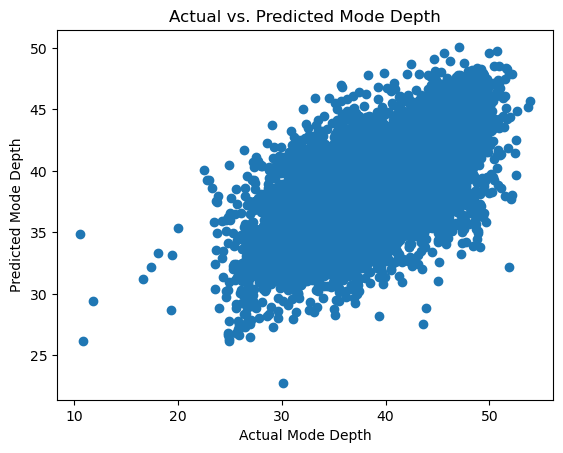

In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame containing the dataset
# Splitting the DataFrame into features (X) and target (y)
X = df.drop(columns=['X', 'Y', 'Mode Depth'])
y = df['Mode Depth']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a StandardScaler object
scaler = StandardScaler()

# Normalize the features - Fit on training data, then transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the RandomForestRegressor model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train_scaled, y_train)

# Model Evaluation
# Make predictions on the testing set
y_pred = model.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("\nModel Evaluation:")
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Plot predicted vs. actual values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Mode Depth')
plt.ylabel('Predicted Mode Depth')
plt.title('Actual vs. Predicted Mode Depth')
plt.show()


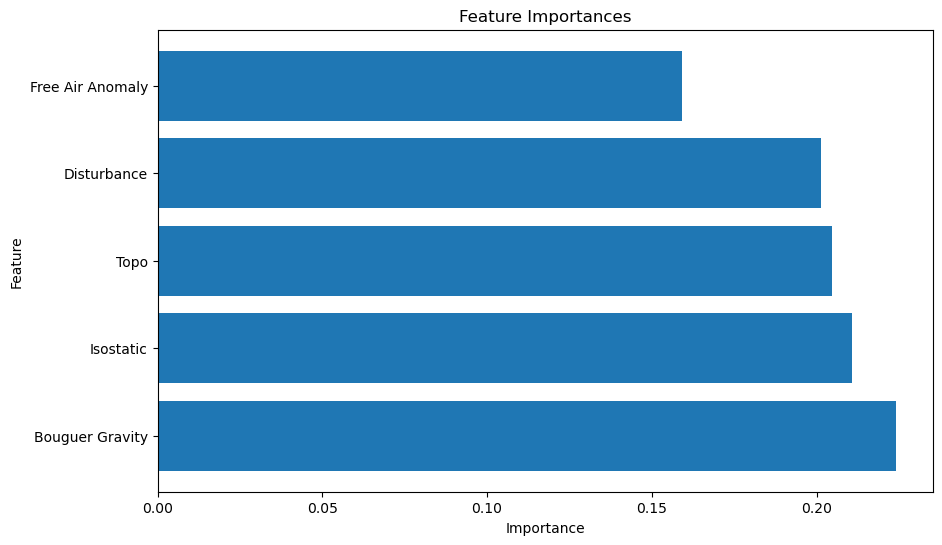

In [4]:
# Extract feature importances
feature_importances = model.feature_importances_

# Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.show()


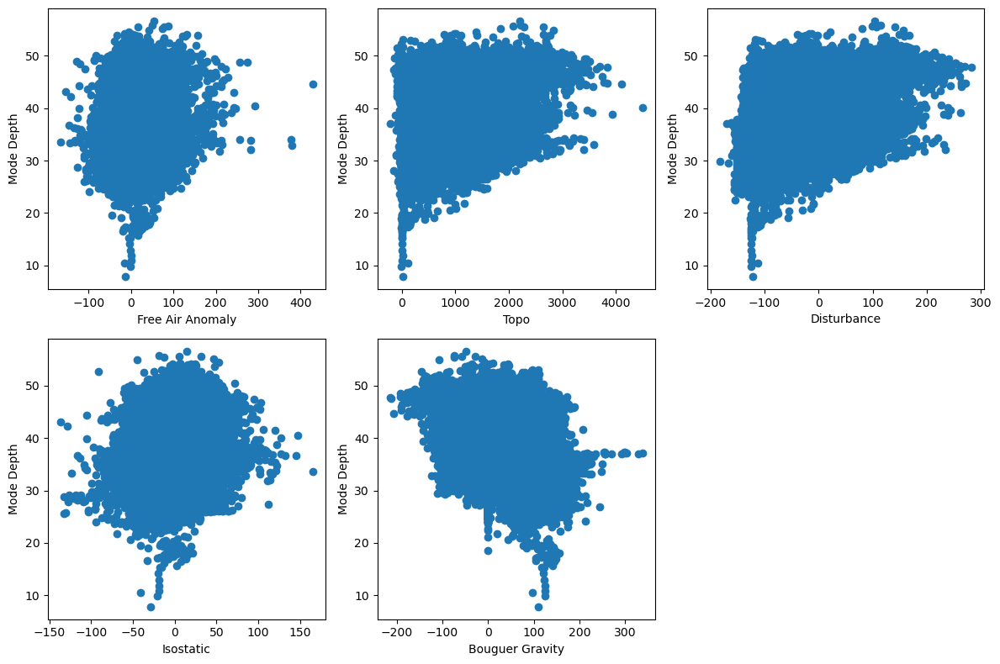

In [5]:
# Create pairwise scatter plots
plt.figure(figsize=(12, 8))
for i, feature in enumerate(X.columns):
    plt.subplot(2, 3, i + 1)
    plt.scatter(df[feature], df['Mode Depth'])
    plt.xlabel(feature)
    plt.ylabel('Mode Depth')
plt.tight_layout()
plt.show()


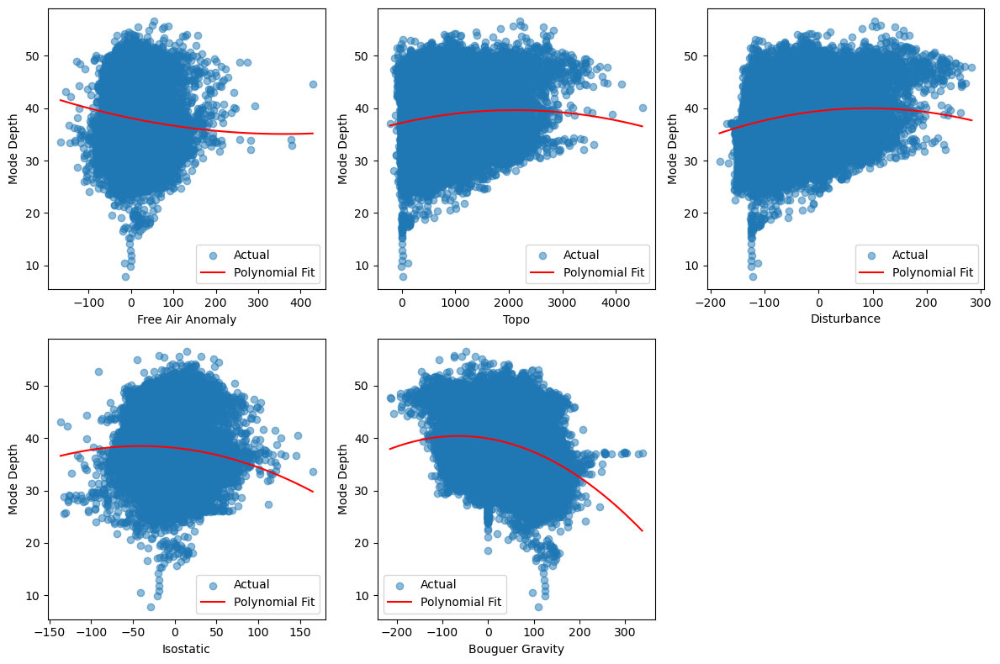

In [19]:
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Define a function to fit polynomial regression and make predictions
def fit_polynomial(X, y, degree):
    # Convert Series to NumPy array
    X = X.values
    
    # Polynomial features transformation
    poly_features = PolynomialFeatures(degree=degree)
    X_poly = poly_features.fit_transform(X.reshape(-1, 1))

    # Fit polynomial regression model
    model = LinearRegression()
    model.fit(X_poly, y)
    
    return model

# Create pairwise scatter plots with polynomial lines
plt.figure(figsize=(12, 8))
for i, feature in enumerate(X.columns):
    # Scatter plot
    plt.subplot(2, 3, i + 1)
    plt.scatter(df[feature], df['Mode Depth'], alpha=0.5, label='Actual')

    # Fit polynomial regression line
    model = fit_polynomial(df[feature], df['Mode Depth'], degree=2)  # You can adjust the degree of the polynomial
    x_values = np.linspace(df[feature].min(), df[feature].max(), 100)
    poly_features = PolynomialFeatures(degree=2)  # Define poly_features within the loop
    y_values = model.predict(poly_features.fit_transform(x_values.reshape(-1, 1)))
    plt.plot(x_values, y_values, color='red', label='Polynomial Fit')
    
    plt.xlabel(feature)
    plt.ylabel('Mode Depth')
    
    plt.legend()

plt.tight_layout()
plt.show()



!pip install optuna

import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import optuna
from sklearn.model_selection import cross_val_score

# Explore interactions between features and incorporate them into the model if they seem informative
poly = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly = poly.fit_transform(X_train_scaled)
X_test_poly = poly.transform(X_test_scaled)

# Dimensionality Reduction
pca = PCA(n_components=10)
X_train_pca = pca.fit_transform(X_train_poly)
X_test_pca = pca.transform(X_test_poly)

# Initialize regression algorithms
models = [
    ('RandomForest', RandomForestRegressor()),
    ('GradientBoosting', GradientBoostingRegressor()),
    ('SVR', SVR())
]

# Define a stacking regressor with RandomForestRegressor as the final estimator
stacking_regressor = StackingRegressor(estimators=models, final_estimator=RandomForestRegressor())

# Define a custom scorer for cross-validation
scorer = 'neg_mean_squared_error'

# Perform k-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

for name, model in models + [('Stacking', stacking_regressor)]:
    scores = cross_val_score(model, X_train_pca, y_train, cv=kf, scoring=scorer)
    print(f'{name} - Mean Squared Error: {scores.mean()}')

# Hyperparameter optimization using Optuna
def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
    }
    model = RandomForestRegressor(**params)
    score = cross_val_score(model, X_train_pca, y_train, cv=kf, scoring=scorer).mean()
    return score

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=10)

best_params = study.best_params
best_model = RandomForestRegressor(**best_params)
best_score = cross_val_score(best_model, X_train_pca, y_train, cv=kf, scoring=scorer).mean()

print(f'Best Parameters: {best_params}')
print(f'Best Mean Squared Error: {best_score}')

# Train the best model
best_model.fit(X_train_pca, y_train)

# Make predictions on the testing set
y_pred = best_model.predict(X_test_pca)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("\nModel Evaluation:")
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Plot predicted vs. actual values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Mode Depth')
plt.ylabel('Predicted Mode Depth')
plt.title('Actual vs. Predicted Mode Depth')
plt.show()



Model Evaluation:
Mean Squared Error: 17.500164849518296
R-squared: 0.43512142721546143


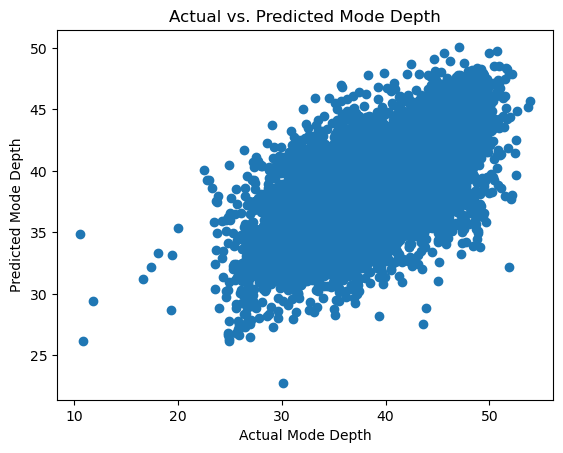

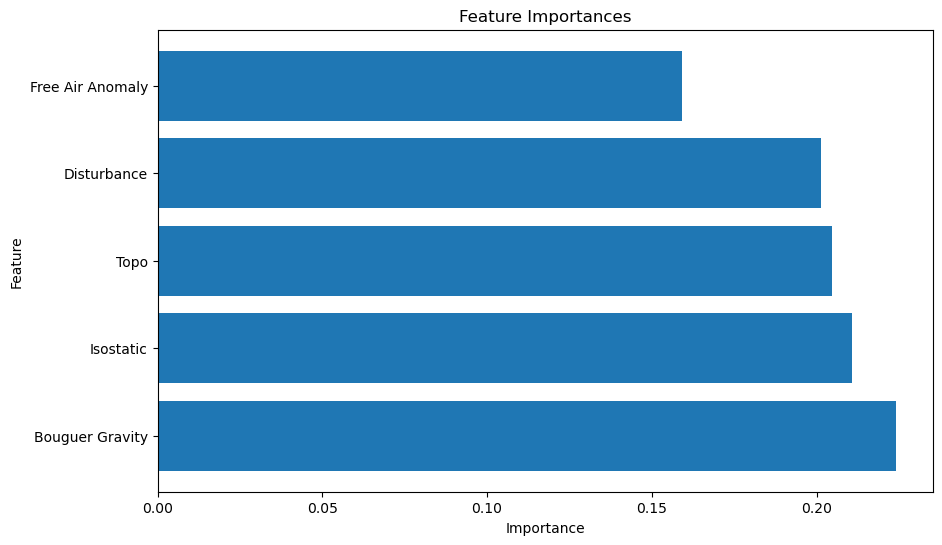

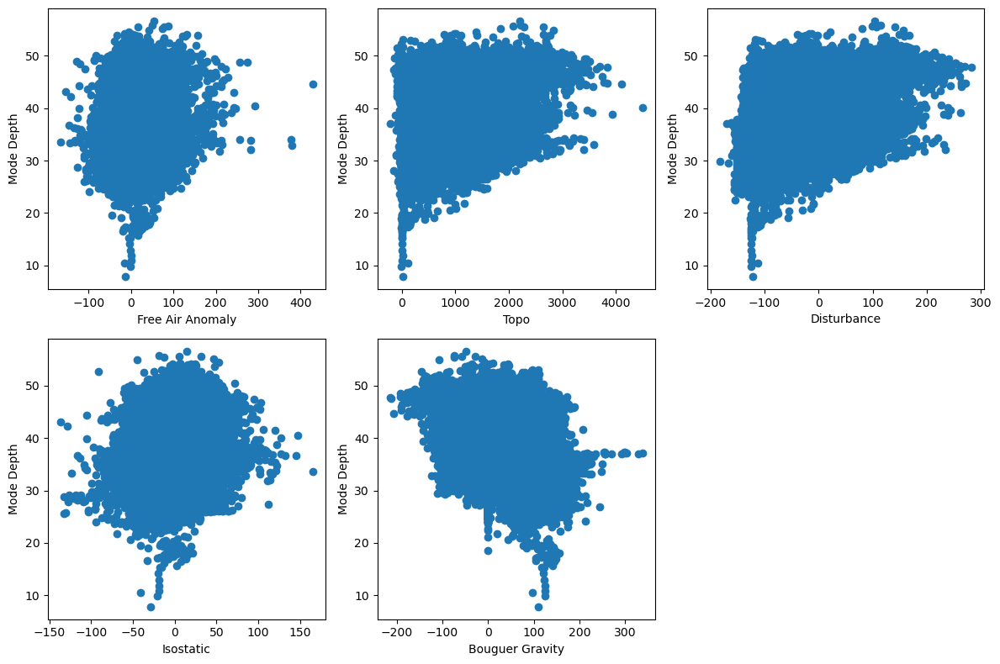

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler

# Load the dataset
file_path = r'C:/Users/gargi/Downloads/US_Canada_Moho_Project.xlsx'
df = pd.read_excel(file_path)

# Assuming 'df' is your DataFrame containing the dataset
# Splitting the DataFrame into features (X) and target (y)
X = df.drop(columns=['X', 'Y', 'Mode Depth'])
y = df['Mode Depth']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a StandardScaler object
scaler = StandardScaler()

# Normalize the features - Fit on training data, then transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the RandomForestRegressor model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train_scaled, y_train)

# Model Evaluation
# Make predictions on the testing set
y_pred = model.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("\nModel Evaluation:")
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Plot predicted vs. actual values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Mode Depth')
plt.ylabel('Predicted Mode Depth')
plt.title('Actual vs. Predicted Mode Depth')
plt.show()

# Extract feature importances
feature_importances = model.feature_importances_

# Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.show()

# Create pairwise scatter plots
plt.figure(figsize=(12, 8))
for i, feature in enumerate(X.columns):
    plt.subplot(2, 3, i + 1)
    plt.scatter(df[feature], df['Mode Depth'])
    plt.xlabel(feature)
    plt.ylabel('Mode Depth')
plt.tight_layout()
plt.show()


  Obtaining dependency information for tensorflow from https://files.pythonhosted.org/packages/e4/14/d795bb156f8cc10eb1dcfe1332b7dbb8405b634688980aa9be8f885cc888/tensorflow-2.16.1-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for tensorflow-intel==2.16.1 from https://files.pythonhosted.org/packages/e0/36/6278e4e7e69a90c00e0f82944d8f2713dd85a69d1add455d9e50446837ab/tensorflow_intel-2.16.1-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for absl-py>=1.0.0 from https://files.pythonhosted.org/packages/a2/ad/e0d3c824784ff121c03cc031f944bc7e139a8f1870ffd2845cc2dd76f6c4/absl_py-2.1.0-py3-none-any.whl.metadata
  Obtaining dependency information for astunparse>=1.6.0 from https://files.pythonhosted.org/packages/2b/03/13dde6512ad7b4557eb792fbcf0c653af6076b81e5941d36ec61f7ce6028/astunparse-1.6.3-py2.py3-none-any.whl.metadata
  Obtaining dependency information for flatbuffers>=23.5.26 from https://files.pythonhosted.org/packages/41/f0/7e988a019bc54b2db

c:\Users\gargi\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
907/907 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 461.2573 - val_loss: 26.8717
Epoch 2/100
907/907 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 26.1970 - val_loss: 24.2119
Epoch 3/100
907/907 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 24.4314 - val_loss: 22.5001
Epoch 4/100
907/907 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 23.0454 - val_loss: 22.0001
Epoch 5/100
907/907 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 23.0619 - val_loss: 21.5633
Epoch 6/100
907/907 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 22.2432 - val_loss: 21.8903
Epoch 7/100
907/907 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 21.7316 - val_loss: 21.1107
Epoch 8/100
907/907 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 21.5897 - val_loss: 20.6594
Epoch 9/100
907/907 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 21.3652 - val_loss: 20.2102
Epoch 10/100
907/907 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 21.1935 - val_loss: 19.8538
Epoch 11/100
907/907 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 20.4796 - val_loss: 19.3537
Epoch 12/100
907/9

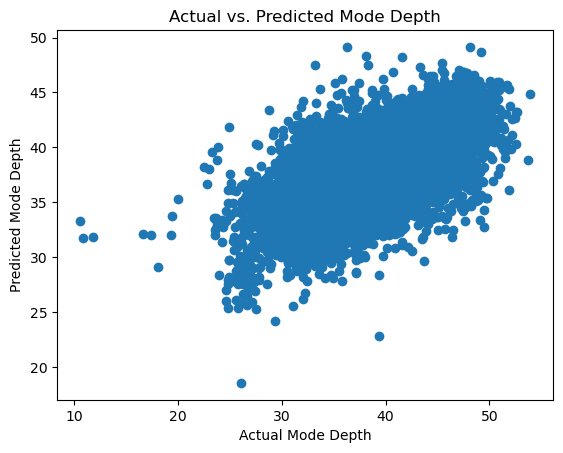

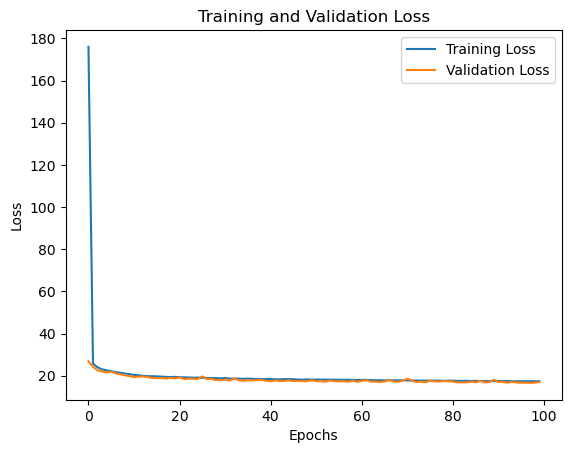

In [24]:
%pip install tensorflow


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Assuming 'df' is your DataFrame containing the dataset
# Splitting the DataFrame into features (X) and target (y)
X = df.drop(columns=['X', 'Y', 'Mode Depth'])
y = df['Mode Depth']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a StandardScaler object
scaler = StandardScaler()

# Normalize the features - Fit on training data, then transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the neural network architecture
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train_scaled.shape[1],)),
    Dense(64, activation='relu'),
    Dense(1)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the model
y_pred = model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("\nModel Evaluation:")
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Plot predicted vs. actual values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Mode Depth')
plt.ylabel('Predicted Mode Depth')
plt.title('Actual vs. Predicted Mode Depth')
plt.show()

# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


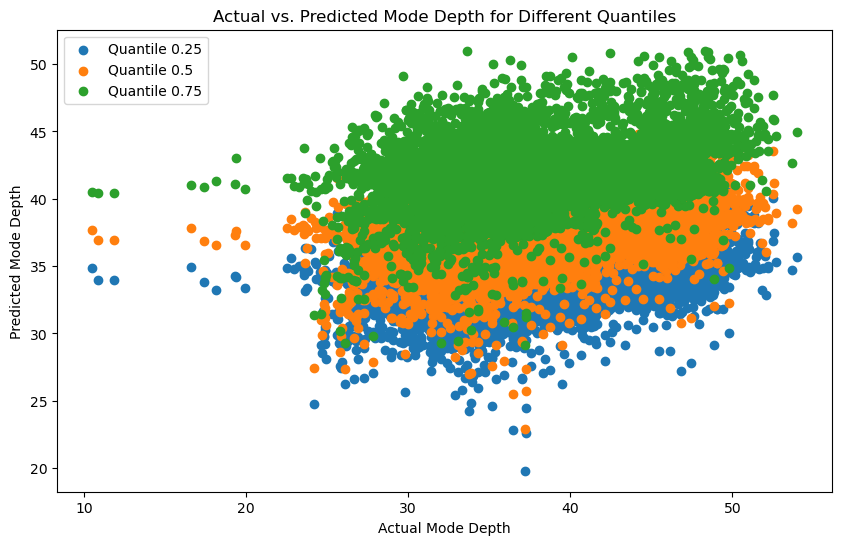

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Assuming 'df' is your DataFrame containing the dataset
# Splitting the DataFrame into features (X) and target (y)
X = df.drop(columns=['X', 'Y', 'Mode Depth'])
y = df['Mode Depth']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a StandardScaler object
scaler = StandardScaler()

# Normalize the features - Fit on training data, then transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fit quantile regression models for different quantiles
quantiles = [0.25, 0.5, 0.75]  # You can adjust this list as needed
quantile_models = {}
for q in quantiles:
    model = sm.QuantReg(y_train, sm.add_constant(X_train_scaled)).fit(q=q)
    quantile_models[q] = model

# Plotting
plt.figure(figsize=(10, 6))
for q, model in quantile_models.items():
    quantile_prediction = model.predict(sm.add_constant(X_test_scaled))
    plt.scatter(y_test, quantile_prediction, label=f'Quantile {q}')
plt.xlabel('Actual Mode Depth')
plt.ylabel('Predicted Mode Depth')
plt.title('Actual vs. Predicted Mode Depth for Different Quantiles')
plt.legend()
plt.show()



In [26]:
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression

# 1. Clustering
# Use K-means or DBSCAN to cluster the data
kmeans = KMeans(n_clusters=3)  # Example with 3 clusters
cluster_labels = kmeans.fit_predict(X)

# 2. Fit Separate Regression Lines
# For each cluster, fit a separate linear regression model
regression_models = {}
for cluster in range(kmeans.n_clusters):
    cluster_X = X[cluster_labels == cluster]
    cluster_y = y[cluster_labels == cluster]
    regression_models[cluster] = LinearRegression().fit(cluster_X, cluster_y)

# 3. Prediction
# Predict mode depth using the appropriate regression model for each data point
y_pred = np.empty_like(y)
for cluster in range(kmeans.n_clusters):
    cluster_X = X[cluster_labels == cluster]
    y_pred[cluster_labels == cluster] = regression_models[cluster].predict(cluster_X)

# Evaluate the model
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)
print("\nModel Evaluation:")
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')



c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



Model Evaluation:
Mean Squared Error: 25.274366221341893
R-squared: 0.1752666916558535


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error, r2_score

# Load the dataset
file_path = r'C:/Users/gargi/Downloads/US_Canada_Moho_Project.xlsx'
df = pd.read_excel(file_path)

# Assuming 'df' is your DataFrame containing the dataset
# Splitting the DataFrame into features (X) and target (y)
X = df.drop(columns=['X', 'Y', 'Mode Depth'])
y = df['Mode Depth']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a StandardScaler object
scaler = StandardScaler()

# Normalize the features - Fit on training data, then transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the RandomForestRegressor model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train_scaled, y_train)

# Model Evaluation
# Make predictions on the testing set
y_pred = model.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("\nModel Evaluation:")
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Extract feature importances
feature_importances = model.feature_importances_

# Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.show()

# Create pairwise scatter plots
plt.figure(figsize=(12, 8))
for i, feature in enumerate(X.columns):
    plt.subplot(2, 3, i + 1)
    plt.scatter(df[feature], df['Mode Depth'])
    plt.xlabel(feature)
    plt.ylabel('Mode Depth')
plt.tight_layout()
plt.show()

# Perform K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X)

# Plot the clusters
plt.figure(figsize=(8, 6))
plt.scatter(df['Topo'], df['Mode Depth'], c=clusters, cmap='viridis')
plt.xlabel('Topo')
plt.ylabel('Mode Depth')
plt.title('Clusters Based on Topo and Mode Depth')
plt.colorbar(label='Cluster')
plt.show()

# Fit separate regression lines to each cluster
cluster_data = pd.concat([X, y, pd.Series(clusters, name='Cluster')], axis=1)
plt.figure(figsize=(10, 6))
for cluster_label, cluster_df in cluster_data.groupby('Cluster'):
    cluster_X = cluster_df.drop(columns=['Mode Depth', 'Cluster'])
    cluster_y = cluster_df['Mode Depth']
    cluster_X_train, cluster_X_test, cluster_y_train, cluster_y_test = train_test_split(cluster_X, cluster_y, test_size=0.2, random_state=42)
    cluster_model = RandomForestRegressor(n_estimators=100, random_state=42)
    cluster_model.fit(cluster_X_train, cluster_y_train)
    cluster_y_pred = cluster_model.predict(cluster_X_test)
    plt.scatter(cluster_y_test, cluster_y_pred, label=f'Cluster {cluster_label}')

plt.xlabel('Actual Mode Depth')
plt.ylabel('Predicted Mode Depth')
plt.title('Actual vs. Predicted Mode Depth for Different Clusters')
plt.legend()
plt.show()


In [8]:
Requirement already satisfied: optuna in c:\users\gargi\anaconda3\lib\site-packages (3.6.1)
Requirement already satisfied: alembic>=1.5.0 in c:\users\gargi\anaconda3\lib\site-packages (from optuna) (1.13.1)
Requirement already satisfied: colorlog in c:\users\gargi\anaconda3\lib\site-packages (from optuna) (6.8.2)
Requirement already satisfied: numpy in c:\users\gargi\anaconda3\lib\site-packages (from optuna) (1.24.3)
Requirement already satisfied: packaging>=20.0 in c:\users\gargi\anaconda3\lib\site-packages (from optuna) (23.1)
Requirement already satisfied: sqlalchemy>=1.3.0 in c:\users\gargi\anaconda3\lib\site-packages (from optuna) (1.4.39)
Requirement already satisfied: tqdm in c:\users\gargi\anaconda3\lib\site-packages (from optuna) (4.65.0)
Requirement already satisfied: PyYAML in c:\users\gargi\anaconda3\lib\site-packages (from optuna) (6.0)
Requirement already satisfied: Mako in c:\users\gargi\anaconda3\lib\site-packages (from alembic>=1.5.0->optuna) (1.3.3)
Requirement already satisfied: typing-extensions>=4 in c:\users\gargi\anaconda3\lib\site-packages (from alembic>=1.5.0->optuna) (4.7.1)
Requirement already satisfied: greenlet!=0.4.17 in c:\users\gargi\anaconda3\lib\site-packages (from sqlalchemy>=1.3.0->optuna) (2.0.1)
Requirement already satisfied: colorama in c:\users\gargi\anaconda3\lib\site-packages (from colorlog->optuna) (0.4.6)
Requirement already satisfied: MarkupSafe>=0.9.2 in c:\users\gargi\anaconda3\lib\site-packages (from Mako->alembic>=1.5.0->optuna) (2.1.1)
RandomForest - Mean Squared Error: -16.37846911344249
GradientBoosting - Mean Squared Error: -19.799954828561503
SVR - Mean Squared Error: -23.514554458260747
[I 2024-04-19 13:53:30,300] A new study created in memory with name: no-name-d8ee784f-8b6d-49a7-8abf-73cc24ada45c
Stacking - Mean Squared Error: -18.049727241261333
[I 2024-04-19 13:59:15,606] Trial 0 finished with value: -22.136518906658193 and parameters: {'n_estimators': 130, 'max_depth': 5, 'min_samples_split': 10, 'min_samples_leaf': 10}. Best is trial 0 with value: -22.136518906658193.
[I 2024-04-19 14:08:32,582] Trial 1 finished with value: -18.373653100728053 and parameters: {'n_estimators': 120, 'max_depth': 9, 'min_samples_split': 11, 'min_samples_leaf': 3}. Best is trial 0 with value: -22.136518906658193.
[I 2024-04-19 14:13:42,784] Trial 2 finished with value: -24.965544856500042 and parameters: {'n_estimators': 191, 'max_depth': 3, 'min_samples_split': 12, 'min_samples_leaf': 3}. Best is trial 2 with value: -24.965544856500042.
[I 2024-04-19 14:24:54,959] Trial 3 finished with value: -17.944247582904715 and parameters: {'n_estimators': 134, 'max_depth': 10, 'min_samples_split': 6, 'min_samples_leaf': 10}. Best is trial 2 with value: -24.965544856500042.
[I 2024-04-19 14:30:14,273] Trial 4 finished with value: -23.418609532133132 and parameters: {'n_estimators': 149, 'max_depth': 4, 'min_samples_split': 8, 'min_samples_leaf': 9}. Best is trial 2 with value: -24.965544856500042.
[I 2024-04-19 14:36:21,913] Trial 5 finished with value: -23.42637397354618 and parameters: {'n_estimators': 172, 'max_depth': 4, 'min_samples_split': 4, 'min_samples_leaf': 7}. Best is trial 2 with value: -24.965544856500042.
[I 2024-04-19 14:41:03,296] Trial 6 finished with value: -23.45121389609259 and parameters: {'n_estimators': 131, 'max_depth': 4, 'min_samples_split': 3, 'min_samples_leaf': 9}. Best is trial 2 with value: -24.965544856500042.
[I 2024-04-19 14:52:41,659] Trial 7 finished with value: -19.048995510937907 and parameters: {'n_estimators': 168, 'max_depth': 8, 'min_samples_split': 15, 'min_samples_leaf': 2}. Best is trial 2 with value: -24.965544856500042.
[I 2024-04-19 14:59:17,694] Trial 8 finished with value: -22.126130112709898 and parameters: {'n_estimators': 149, 'max_depth': 5, 'min_samples_split': 12, 'min_samples_leaf': 8}. Best is trial 2 with value: -24.965544856500042.
[I 2024-04-20 15:24:36,302] Trial 9 finished with value: -19.888390406266044 and parameters: {'n_estimators': 169, 'max_depth': 7, 'min_samples_split': 4, 'min_samples_leaf': 3}. Best is trial 2 with value: -24.965544856500042.
[I 2024-04-20 15:26:56,706] Trial 10 finished with value: -24.98215510161576 and parameters: {'n_estimators': 79, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 5}. Best is trial 10 with value: -24.98215510161576.
[I 2024-04-20 15:29:02,253] Trial 11 finished with value: -24.958655454005857 and parameters: {'n_estimators': 75, 'max_depth': 3, 'min_samples_split': 19, 'min_samples_leaf': 5}. Best is trial 10 with value: -24.98215510161576.
[I 2024-04-20 15:30:32,415] Trial 12 finished with value: -24.96745340410062 and parameters: {'n_estimators': 54, 'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 5}. Best is trial 10 with value: -24.98215510161576.
[I 2024-04-20 15:33:35,992] Trial 13 finished with value: -20.961277479891425 and parameters: {'n_estimators': 57, 'max_depth': 6, 'min_samples_split': 20, 'min_samples_leaf': 5}. Best is trial 10 with value: -24.98215510161576.
[I 2024-04-20 15:36:10,605] Trial 14 finished with value: -24.954477869986004 and parameters: {'n_estimators': 91, 'max_depth': 3, 'min_samples_split': 17, 'min_samples_leaf': 6}. Best is trial 10 with value: -24.98215510161576.
[I 2024-04-20 15:38:58,432] Trial 15 finished with value: -20.943069301292066 and parameters: {'n_estimators': 50, 'max_depth': 6, 'min_samples_split': 16, 'min_samples_leaf': 6}. Best is trial 10 with value: -24.98215510161576.

SyntaxError: invalid syntax (2888908845.py, line 1)


Model Evaluation:
Mean Squared Error: 17.500164849518296
R-squared: 0.43512142721546143


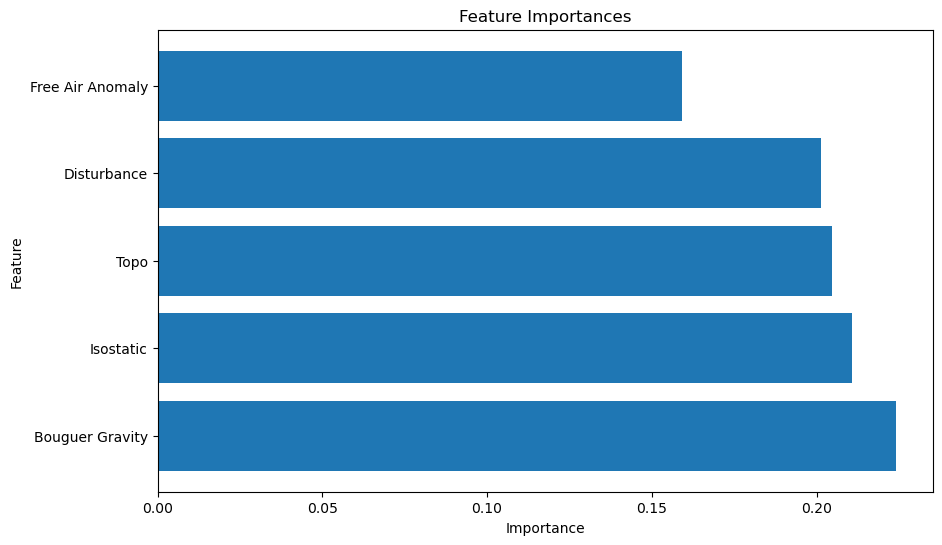

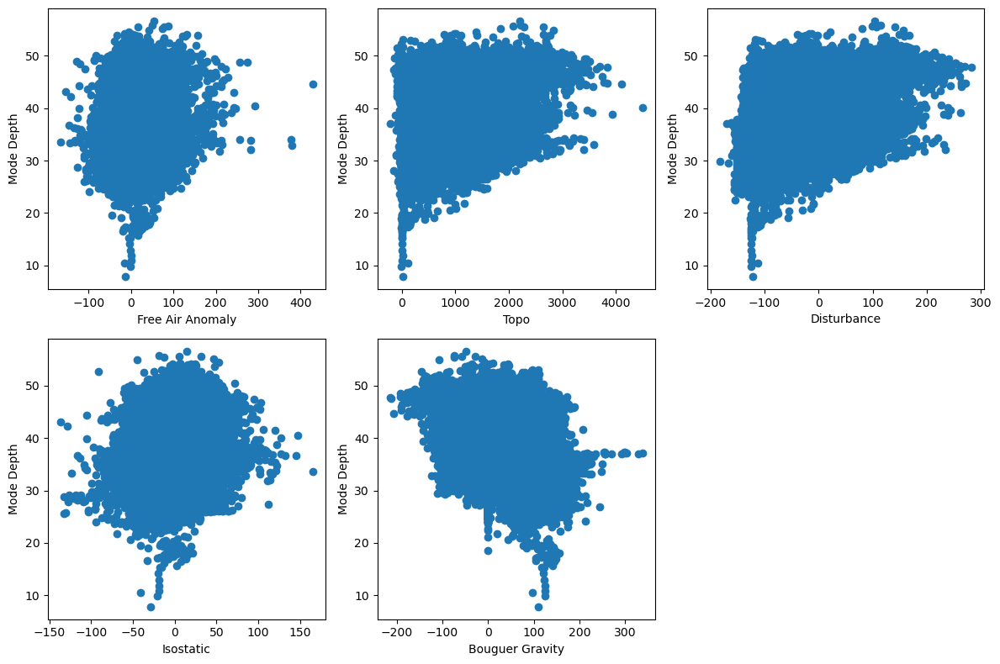

c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


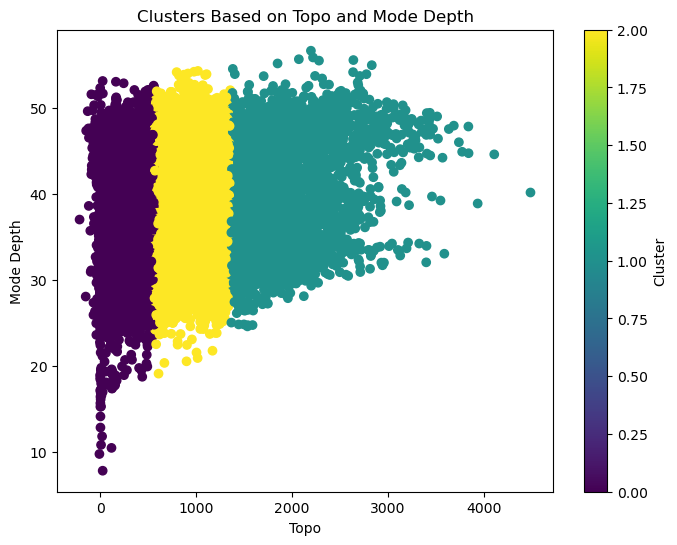

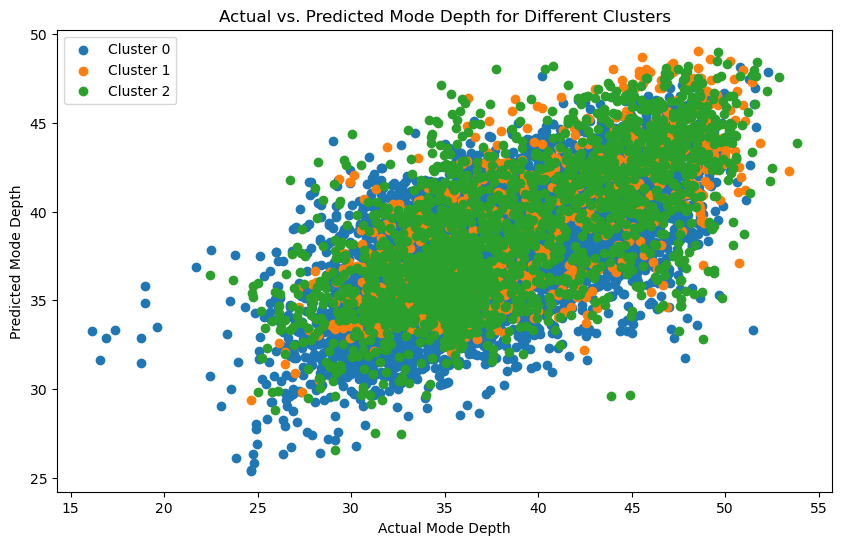

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error, r2_score

# Load the dataset
file_path = r'C:/Users/gargi/Downloads/US_Canada_Moho_Project.xlsx'
df = pd.read_excel(file_path)

# Assuming 'df' is your DataFrame containing the dataset
# Splitting the DataFrame into features (X) and target (y)
X = df.drop(columns=['X', 'Y', 'Mode Depth'])
y = df['Mode Depth']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a StandardScaler object
scaler = StandardScaler()

# Normalize the features - Fit on training data, then transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the RandomForestRegressor model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train_scaled, y_train)

# Model Evaluation
# Make predictions on the testing set
y_pred = model.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("\nModel Evaluation:")
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Extract feature importances
feature_importances = model.feature_importances_

# Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.show()

# Create pairwise scatter plots
plt.figure(figsize=(12, 8))
for i, feature in enumerate(X.columns):
    plt.subplot(2, 3, i + 1)
    plt.scatter(df[feature], df['Mode Depth'])
    plt.xlabel(feature)
    plt.ylabel('Mode Depth')
plt.tight_layout()
plt.show()

# Perform K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X)

# Plot the clusters
plt.figure(figsize=(8, 6))
plt.scatter(df['Topo'], df['Mode Depth'], c=clusters, cmap='viridis')
plt.xlabel('Topo')
plt.ylabel('Mode Depth')
plt.title('Clusters Based on Topo and Mode Depth')
plt.colorbar(label='Cluster')
plt.show()

# Fit separate regression lines to each cluster
cluster_data = pd.concat([X, y, pd.Series(clusters, name='Cluster')], axis=1)
plt.figure(figsize=(10, 6))
for cluster_label, cluster_df in cluster_data.groupby('Cluster'):
    cluster_X = cluster_df.drop(columns=['Mode Depth', 'Cluster'])
    cluster_y = cluster_df['Mode Depth']
    cluster_X_train, cluster_X_test, cluster_y_train, cluster_y_test = train_test_split(cluster_X, cluster_y, test_size=0.2, random_state=42)
    cluster_model = RandomForestRegressor(n_estimators=100, random_state=42)
    cluster_model.fit(cluster_X_train, cluster_y_train)
    cluster_y_pred = cluster_model.predict(cluster_X_test)
    plt.scatter(cluster_y_test, cluster_y_pred, label=f'Cluster {cluster_label}')

plt.xlabel('Actual Mode Depth')
plt.ylabel('Predicted Mode Depth')
plt.title('Actual vs. Predicted Mode Depth for Different Clusters')
plt.legend()
plt.show()


c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\gargi\an


Model Evaluation:
Mean Squared Error: 25.885794027003783
R-squared: 0.16444613458764534


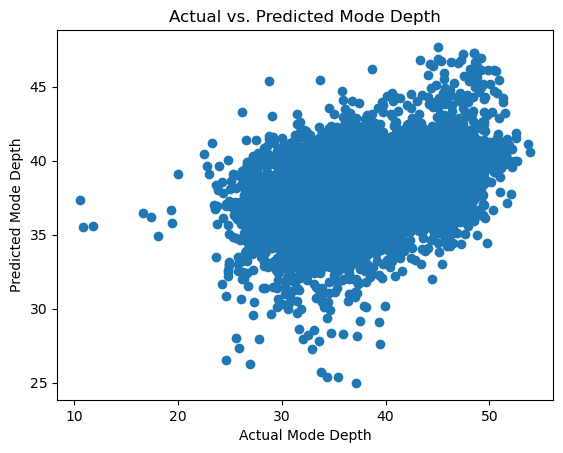

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression

# Load the dataset
file_path = r'C:/Users/gargi/Downloads/US_Canada_Moho_Project.xlsx'
df = pd.read_excel(file_path)

# Splitting the DataFrame into features (X) and target (y)
X = df.drop(columns=['X', 'Y', 'Mode Depth'])
y = df['Mode Depth']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit K-means clustering to identify segments
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_train)

# Fit separate linear regression models for each cluster
models = {}
for cluster_label in np.unique(clusters):
    cluster_data = X_train[clusters == cluster_label]
    cluster_target = y_train[clusters == cluster_label]
    model = LinearRegression()
    model.fit(cluster_data, cluster_target)
    models[cluster_label] = model

# Predict mode depth using appropriate model for each data point
def predict_mode_depth(features):
    cluster_label = kmeans.predict([features])[0]
    return models[cluster_label].predict([features])[0]

# Evaluate the model
y_pred = np.array([predict_mode_depth(x) for x in X_test.values])
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("\nModel Evaluation:")
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Plot predicted vs. actual values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Mode Depth')
plt.ylabel('Predicted Mode Depth')
plt.title('Actual vs. Predicted Mode Depth')
plt.show()


c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


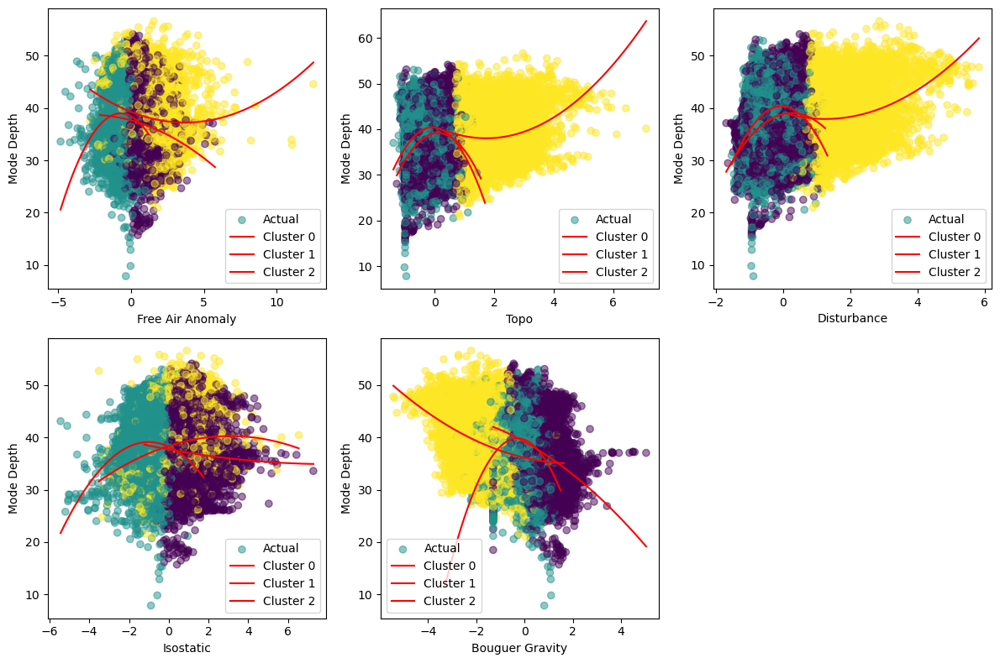

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Load the dataset
file_path = r'C:/Users/gargi/Downloads/US_Canada_Moho_Project.xlsx'
df = pd.read_excel(file_path)

# Assuming 'df' is your DataFrame containing the dataset
# Splitting the DataFrame into features (X) and target (y)
X = df.drop(columns=['X', 'Y', 'Mode Depth'])
y = df['Mode Depth']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a StandardScaler object
scaler = StandardScaler()

# Normalize the features - Fit on training data, then transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fit K-means clustering to identify segments
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_train_scaled)

# Define a function to fit polynomial regression and make predictions
def fit_polynomial(X, y, degree):
    # Polynomial features transformation
    poly_features = PolynomialFeatures(degree=degree)
    X_poly = poly_features.fit_transform(X.reshape(-1, 1))

    # Fit polynomial regression model
    model = LinearRegression()
    model.fit(X_poly, y)
    
    return model

# Create pairwise scatter plots with polynomial lines for each cluster
plt.figure(figsize=(12, 8))
for i, feature in enumerate(X.columns):
    # Scatter plot
    plt.subplot(2, 3, i + 1)
    plt.scatter(X_train_scaled[:, i], y_train, c=clusters, cmap='viridis', alpha=0.5, label='Actual')

    # Fit polynomial regression lines for each cluster
    for cluster_label in np.unique(clusters):
        cluster_data = X_train_scaled[clusters == cluster_label, i]
        cluster_target = y_train[clusters == cluster_label]
        model = fit_polynomial(cluster_data, cluster_target, degree=2)  # Adjust the degree of the polynomial
        x_values = np.linspace(cluster_data.min(), cluster_data.max(), 100)
        y_values = model.predict(PolynomialFeatures(degree=2).fit_transform(x_values.reshape(-1, 1)))
        plt.plot(x_values, y_values, color='red', label=f'Cluster {cluster_label}')

    plt.xlabel(feature)
    plt.ylabel('Mode Depth')
    plt.legend()

plt.tight_layout()
plt.show()


c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


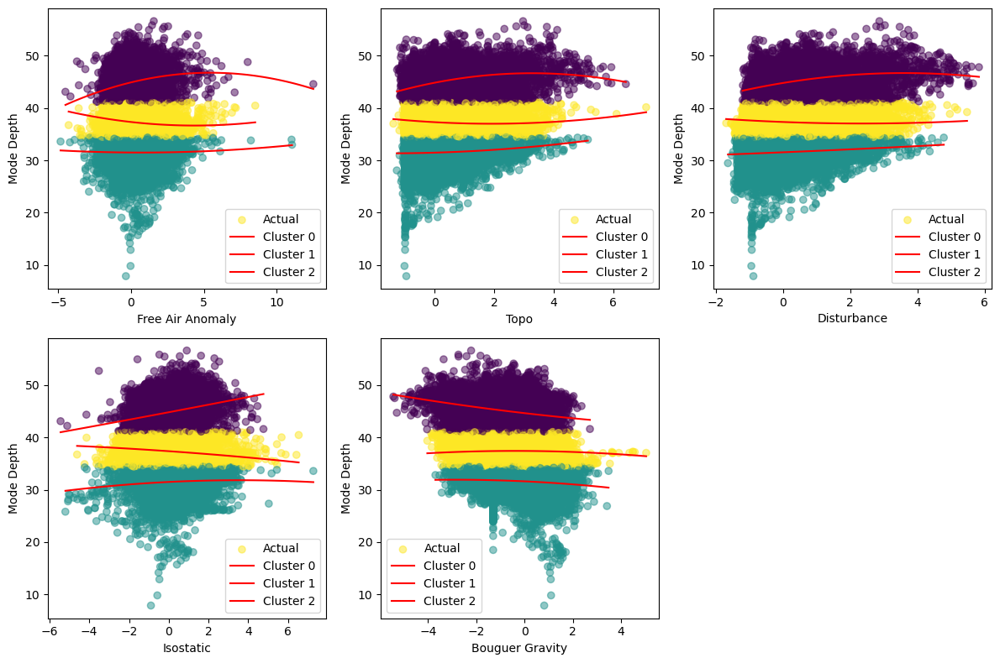

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Load the dataset
file_path = r'C:/Users/gargi/Downloads/US_Canada_Moho_Project.xlsx'
df = pd.read_excel(file_path)

# Assuming 'df' is your DataFrame containing the dataset
# Splitting the DataFrame into features (X) and target (y)
X = df.drop(columns=['X', 'Y', 'Mode Depth'])
y = df['Mode Depth']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a StandardScaler object for features
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Create a StandardScaler object for the target variable (Mode Depth)
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1)).flatten()

# Fit K-means clustering to identify segments based on Mode Depth
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(y_train_scaled.reshape(-1, 1))

# Define a function to fit polynomial regression and make predictions
def fit_polynomial(X, y, degree):
    # Polynomial features transformation
    poly_features = PolynomialFeatures(degree=degree)
    X_poly = poly_features.fit_transform(X.reshape(-1, 1))

    # Fit polynomial regression model
    model = LinearRegression()
    model.fit(X_poly, y)
    
    return model

# Create pairwise scatter plots with polynomial lines for each cluster
plt.figure(figsize=(12, 8))
for i, feature in enumerate(X.columns):
    # Scatter plot
    plt.subplot(2, 3, i + 1)
    plt.scatter(X_train_scaled[:, i], y_train, c=clusters, cmap='viridis', alpha=0.5, label='Actual')

    # Fit polynomial regression lines for each cluster
    for cluster_label in np.unique(clusters):
        cluster_data = X_train_scaled[clusters == cluster_label, i]
        cluster_target = y_train[clusters == cluster_label]
        model = fit_polynomial(cluster_data, cluster_target, degree=2)  # Adjust the degree of the polynomial
        x_values = np.linspace(cluster_data.min(), cluster_data.max(), 100)
        y_values = model.predict(PolynomialFeatures(degree=2).fit_transform(x_values.reshape(-1, 1)))
        plt.plot(x_values, y_values, color='red', label=f'Cluster {cluster_label}')

    plt.xlabel(feature)
    plt.ylabel('Mode Depth')
    plt.legend()

plt.tight_layout()
plt.show()


c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\gargi\an


Model Evaluation:
Mean Squared Error: 18.694497085853598
R-squared: 0.3965702081330753


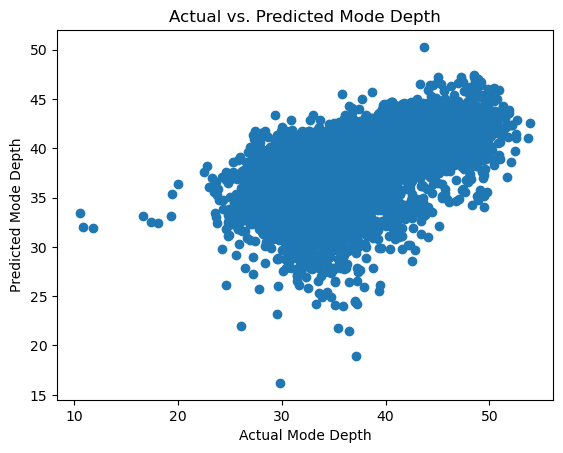

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression

# Load the dataset
file_path = r'C:/Users/gargi/Downloads/US_Canada_Moho_Project.xlsx'
df = pd.read_excel(file_path)

# Splitting the DataFrame into features (X) and target (y)
X = df.drop(columns=[ 'Mode Depth'])
y = df['Mode Depth']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit K-means clustering to identify segments
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_train)

# Fit separate linear regression models for each cluster
models = {}
for cluster_label in np.unique(clusters):
    cluster_data = X_train[clusters == cluster_label]
    cluster_target = y_train[clusters == cluster_label]
    model = LinearRegression()
    model.fit(cluster_data, cluster_target)
    models[cluster_label] = model

# Predict mode depth using appropriate model for each data point
def predict_mode_depth(features):
    cluster_label = kmeans.predict([features])[0]
    return models[cluster_label].predict([features])[0]

# Evaluate the model
y_pred = np.array([predict_mode_depth(x) for x in X_test.values])
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("\nModel Evaluation:")
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Plot predicted vs. actual values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Mode Depth')
plt.ylabel('Predicted Mode Depth')
plt.title('Actual vs. Predicted Mode Depth')
plt.show()


c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Model Evaluation:
Mean Squared Error (Test): 4.771226637972892
R-squared (Test): 0.845992096825083


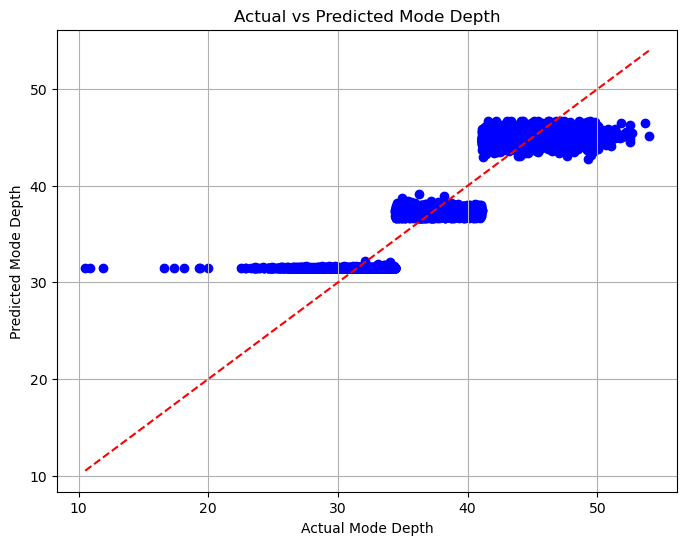

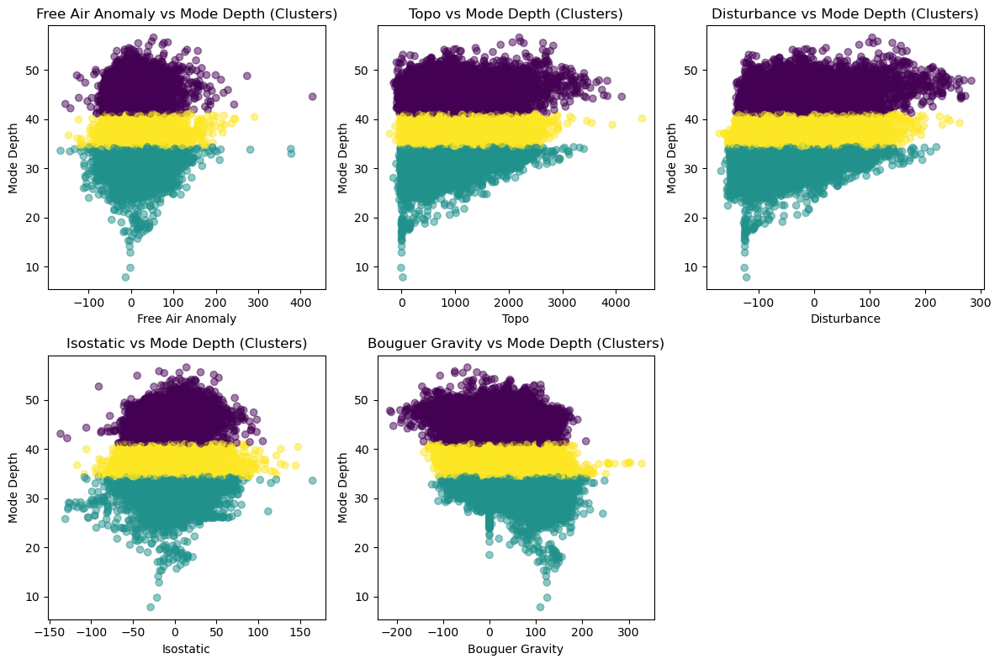

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor

# Load the dataset
file_path = r'C:/Users/gargi/Downloads/US_Canada_Moho_Project.xlsx'
df = pd.read_excel(file_path)

# Assuming 'df' is your DataFrame containing the dataset
# Splitting the DataFrame into features (X) and target (y)
X = df.drop(columns=['X', 'Y', 'Mode Depth'])
y = df['Mode Depth']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a StandardScaler object for features
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Fit K-means clustering to identify segments based on Mode Depth
kmeans = KMeans(n_clusters=3, random_state=42)
clusters_train = kmeans.fit_predict(y_train.values.reshape(-1, 1))
clusters_test = kmeans.predict(y_test.values.reshape(-1, 1))

# Create a StandardScaler object for the target variable (Mode Depth)
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.values.reshape(-1, 1)).flatten()

# Define a function to fit polynomial regression and make predictions
def fit_polynomial(X, y, degree):
    # Polynomial features transformation
    poly_features = PolynomialFeatures(degree=degree)
    X_poly = poly_features.fit_transform(X.reshape(-1, 1))

    # Fit polynomial regression model
    model = LinearRegression()
    model.fit(X_poly, y)
    
    return model

# Fit polynomial regression lines for each cluster on the training data
models = []
for cluster_label in np.unique(clusters_train):
    cluster_data = X_train_scaled[clusters_train == cluster_label, 0]
    cluster_target = y_train_scaled[clusters_train == cluster_label]
    model = fit_polynomial(cluster_data, cluster_target, degree=2)  # Adjust the degree of the polynomial
    models.append(model)

# Predict mode depth for the testing set
y_test_pred = np.zeros_like(y_test_scaled)
for i, model in enumerate(models):
    cluster_data_test = X_test_scaled[clusters_test == i, 0]
    y_test_pred[clusters_test == i] = model.predict(PolynomialFeatures(degree=2).fit_transform(cluster_data_test.reshape(-1, 1)))

# Inverse transform the scaled predictions to get the actual mode depth values
y_test_pred_actual = scaler_y.inverse_transform(y_test_pred.reshape(-1, 1)).flatten()

# Evaluate the model
mse_test = mean_squared_error(y_test, y_test_pred_actual)
r2_test = r2_score(y_test, y_test_pred_actual)

print("Model Evaluation:")
print(f"Mean Squared Error (Test): {mse_test}")
print(f"R-squared (Test): {r2_test}")

# Scatter plot of actual vs predicted mode depth
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_test_pred_actual, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], linestyle='--', color='red')
plt.xlabel('Actual Mode Depth')
plt.ylabel('Predicted Mode Depth')
plt.title('Actual vs Predicted Mode Depth')
plt.grid(True)
plt.show()



# Scatter plots of clusters for each feature compared to mode depth
plt.figure(figsize=(12, 8))
for i, feature in enumerate(X_train.columns):
    plt.subplot(2, 3, i + 1)
    plt.scatter(X_train[feature], y_train, c=clusters_train, cmap='viridis', alpha=0.5)
    plt.xlabel(feature)
    plt.ylabel('Mode Depth')
    plt.title(f'{feature} vs Mode Depth (Clusters)')
plt.tight_layout()
plt.show()




In [10]:
%pip install descartes
%pip install geopandas

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Model Evaluation:
Mean Squared Error (Test): 4.693068049133875
R-squared (Test): 0.8485149366093867


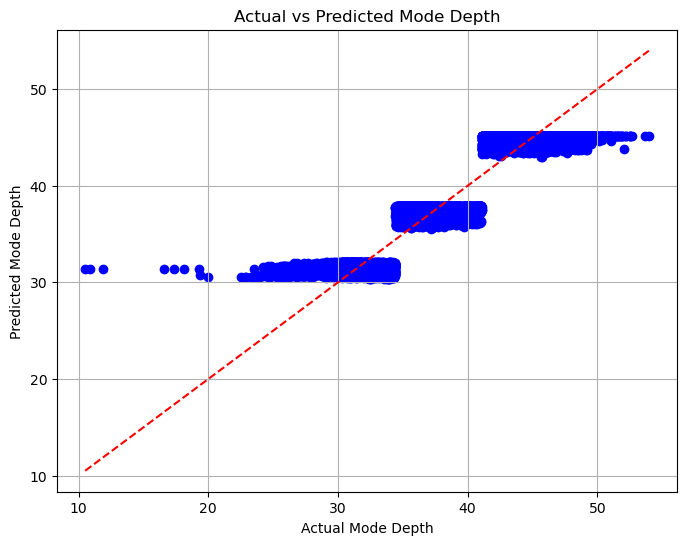

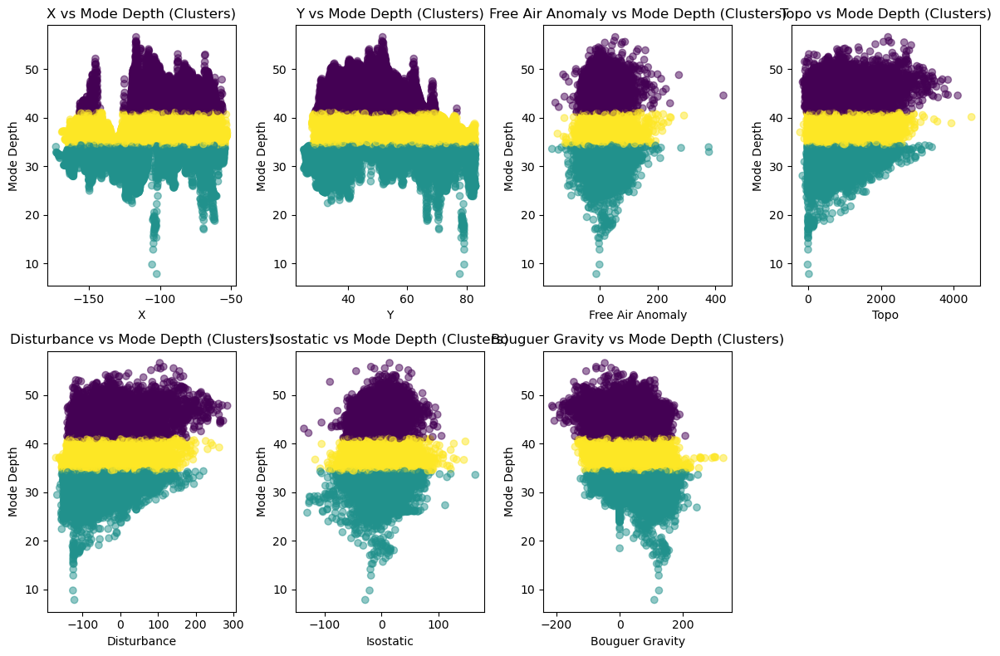

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor

# Load the dataset
file_path = r'C:/Users/gargi/Downloads/US_Canada_Moho_Project.xlsx'
df = pd.read_excel(file_path)

# Assuming 'df' is your DataFrame containing the dataset
# Splitting the DataFrame into features (X) and target (y)
X = df.drop(columns=[ 'Mode Depth'])
y = df['Mode Depth']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a StandardScaler object for features
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Fit K-means clustering to identify segments based on Mode Depth
kmeans = KMeans(n_clusters=3, random_state=42)
clusters_train = kmeans.fit_predict(y_train.values.reshape(-1, 1))
clusters_test = kmeans.predict(y_test.values.reshape(-1, 1))

# Create a StandardScaler object for the target variable (Mode Depth)
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.values.reshape(-1, 1)).flatten()

# Define a function to fit polynomial regression and make predictions
def fit_polynomial(X, y, degree):
    # Polynomial features transformation
    poly_features = PolynomialFeatures(degree=degree)
    X_poly = poly_features.fit_transform(X.reshape(-1, 1))

    # Fit polynomial regression model
    model = LinearRegression()
    model.fit(X_poly, y)
    
    return model

# Fit polynomial regression lines for each cluster on the training data
models = []
for cluster_label in np.unique(clusters_train):
    cluster_data = X_train_scaled[clusters_train == cluster_label, 0]
    cluster_target = y_train_scaled[clusters_train == cluster_label]
    model = fit_polynomial(cluster_data, cluster_target, degree=2)  # Adjust the degree of the polynomial
    models.append(model)

# Predict mode depth for the testing set
y_test_pred = np.zeros_like(y_test_scaled)
for i, model in enumerate(models):
    cluster_data_test = X_test_scaled[clusters_test == i, 0]
    y_test_pred[clusters_test == i] = model.predict(PolynomialFeatures(degree=2).fit_transform(cluster_data_test.reshape(-1, 1)))

# Inverse transform the scaled predictions to get the actual mode depth values
y_test_pred_actual = scaler_y.inverse_transform(y_test_pred.reshape(-1, 1)).flatten()

# Evaluate the model
mse_test = mean_squared_error(y_test, y_test_pred_actual)
r2_test = r2_score(y_test, y_test_pred_actual)

print("Model Evaluation:")
print(f"Mean Squared Error (Test): {mse_test}")
print(f"R-squared (Test): {r2_test}")

# Scatter plot of actual vs predicted mode depth
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_test_pred_actual, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], linestyle='--', color='red')
plt.xlabel('Actual Mode Depth')
plt.ylabel('Predicted Mode Depth')
plt.title('Actual vs Predicted Mode Depth')
plt.grid(True)
plt.show()



# Scatter plots of clusters for each feature compared to mode depth
plt.figure(figsize=(12, 8))
n_features = X_train.shape[1]  # Number of features
for i, feature in enumerate(X_train.columns):
    plt.subplot(2, (n_features + 1) // 2, i + 1)  # Adjusting the number of columns dynamically
    plt.scatter(X_train[feature], y_train, c=clusters_train, cmap='viridis', alpha=0.5)
    plt.xlabel(feature)
    plt.ylabel('Mode Depth')
    plt.title(f'{feature} vs Mode Depth (Clusters)')
plt.tight_layout()
plt.show()





c:\Users\gargi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\gargi\AppData\Local\Temp\ipykernel_7320\2025803243.py:61: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


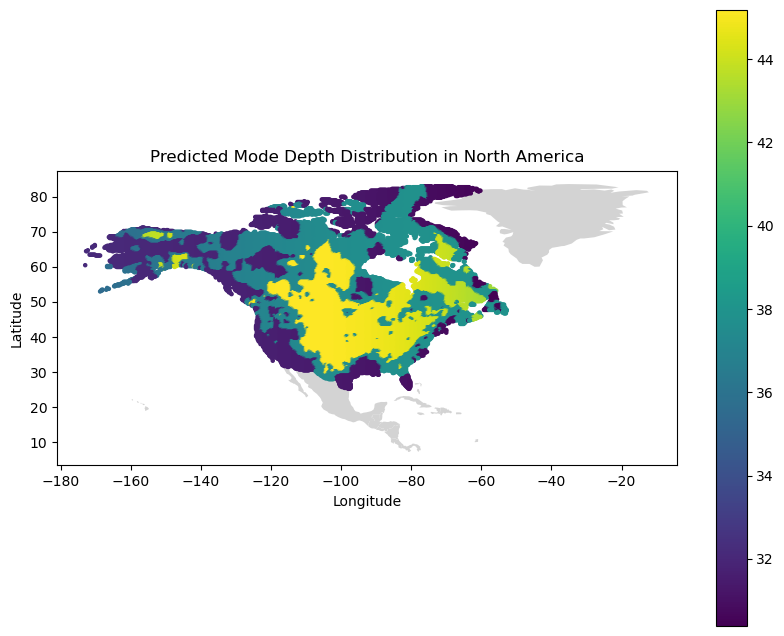

In [20]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np

# Load the dataset
file_path = r'C:/Users/gargi/Downloads/US_Canada_Moho_Project.xlsx'
df = pd.read_excel(file_path)

# Split the DataFrame into features (X) and target (y)
X = df.drop(columns=['Mode Depth'])
y = df['Mode Depth']

# Standardize the features
scaler_X = StandardScaler()
X_scaled = scaler_X.fit_transform(X)

# Fit K-means clustering to identify segments based on Mode Depth
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(y.values.reshape(-1, 1))

# Define a function to fit polynomial regression and make predictions
def fit_polynomial(X, y, degree):
    # Polynomial features transformation
    poly_features = PolynomialFeatures(degree=degree)
    X_poly = poly_features.fit_transform(X.reshape(-1, 1))

    # Fit polynomial regression model
    model = LinearRegression()
    model.fit(X_poly, y)
    
    return model

# Fit polynomial regression lines for each cluster
models = []
for cluster_label in np.unique(clusters):
    cluster_data = X_scaled[clusters == cluster_label, 0]
    cluster_target = y[clusters == cluster_label]
    model = fit_polynomial(cluster_data, cluster_target, degree=2)  # Adjust the degree of the polynomial
    models.append(model)

# Predict mode depth for all data points
y_pred = np.zeros_like(y)
for i, model in enumerate(models):
    cluster_data_all = X_scaled[clusters == i, 0]
    y_pred[clusters == i] = model.predict(PolynomialFeatures(degree=2).fit_transform(cluster_data_all.reshape(-1, 1)))

# Combine latitude, longitude, and predicted mode depth values
df['Predicted Mode Depth'] = y_pred
geometry = [Point(xy) for xy in zip(df['X'], df['Y'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry)

# Plot the map of North America
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
north_america = world[world['continent'] == 'North America']
fig, ax = plt.subplots(figsize=(10, 8))
north_america.plot(ax=ax, color='lightgrey')

# Plot the data points with predicted mode depth
gdf.plot(ax=ax, column='Predicted Mode Depth', cmap='viridis', markersize=5, legend=True)

plt.title('Predicted Mode Depth Distribution in North America')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()
